# Practica 1

In [3]:
RUTA_IMAGEN = "/home/carlos/MURIA_wsl/Vision_Computadora/Practica_1/VICO_lamb/color/1f297cd7d88a4c06854f51f37bee7379_color.png"   # <-- cambia esto


Hay que descargarse las imagenes del dataset que contiene la mascara real segmentada de imágenes de corderos https://github.com/ULE-Informatica-2024-2025/VICO_lamb.git 

El objetivo es encontrar el mejor procesamiento de las imágenes a color para obtener las
máscaras.
El procesamiento debe incluir al menos los siguientes pasos:
1. Preprocesamiento: Aplicar filtros de suavizado para reducir el ruido o mejorar los
bordes.
2. Binarización: Aplicar binarización a las imágenes preprocesadas para obtener
máscaras binarias.
3. Operaciones Morfológicas: Realizar operaciones morfológicas sobre las máscaras binarias para mejorar los resultados

## Presentación de los datos

En esta sección se realiza la lectura de la carpeta de `VICO_lamb/colors` y se realiza un breve estudio del dataset

In [47]:
from images_functions.data_io.read_data import read_image_from_cv2, read_image_from_cv2
from images_functions.data_io.read_imgs_directory import list_images_in_directory
from images_functions.data_io.save_data import save_image_cv2
from images_functions.visualization.plot_images import show_image_cv2, show_set_of_images, show_N_random_images
from images_functions.utils.extract_channels import decompose_image_channels, extract_rgb_channels
import cv2 

In [48]:
img_path = 'VICO_lamb/color'
list_imgs = list_images_in_directory(img_path)

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


Extraemos un conjutno pequeño de los datos obtenidos.

In [49]:
path_img = "VICO_lamb/color"
list_imgs = list_images_in_directory(path_img)
for img_path in list_imgs[:5]:
    print(img_path)

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
VICO_lamb/color/6e0c625ec0c44dac830949bd9cbea3a7_color.png
VICO_lamb/color/11aa0fed921d489cade98b0b400bd657_color.png
VICO_lamb/color/8e24008645394f488c5a1615814c80cb_color.png
VICO_lamb/color/9bcfb6a0f8f346e9bd717fedd950de4c_color.png
VICO_lamb/color/02d9af059de246a6857ef016342b6509_color.png


Vamos a realizar la lectura y visualización de una imagen especifica, la primera que se encuentra en el array de `list_imgs`.

Una imagen leida en formato **Gray Scale**, los datos tienen un formato de `(width, height)`, mientras que los datos en **RGB** al contar con los 3 canales de color, los datos tienen un formato de `(width, height, 3)`.

In [50]:
idx = 10
img_selected = list_imgs[idx]
print(f'Image selected: {img_selected}')

Image selected: VICO_lamb/color/347b179edf5942cba7944539bfef5e42_color.png


Gray Image shape(480, 848)


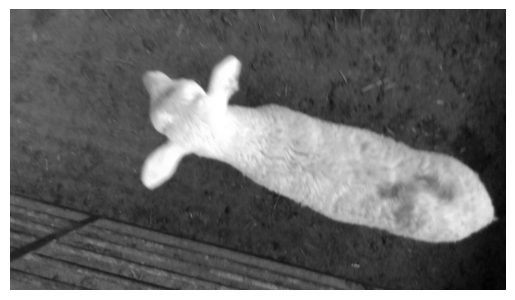

In [51]:
img_gray = read_image_from_cv2(img_selected, cv2.IMREAD_GRAYSCALE)
print(f'Gray Image shape{img_gray.shape}') # (480, 848) GrayScale
show_image_cv2(img_gray)

RGB Image shape: (480, 848, 3)


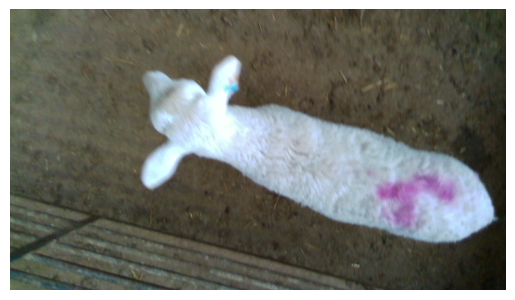

In [52]:
img_rgb = read_image_from_cv2(img_selected, cv2.COLOR_BGR2RGB)
print(f'RGB Image shape: {img_rgb.shape}') # (480, 848, 3) BGR
show_image_cv2(img_rgb)

De la imagen RGB nos podemos quedar con uno o dos de los canales si queremos. Esto se puede conseguir si hacemos "cero" el canal o canales que no deseamos. Lo realizo de esta manera para poder visualizarlo en RGB y para inspección visual es más cómodo. 

In [53]:
image_r = extract_rgb_channels(img_rgb, channels=['R']) 
image_g = extract_rgb_channels(img_rgb, channels=['G'])
image_b = extract_rgb_channels(img_rgb, channels=['B'])
image_rb = extract_rgb_channels(img_rgb, channels=['R', 'B'])

Luego hay otra opción que para acceder de manera cómoda a la imagen en escapa de grises, rgb o las intensidades de cada uno de los colores, podemos utilizar la siguiente función `decompose_image_channels`.  (Esta función es útil si queremos ir estudiando cada uno de los casos, si queremos leer solo la imágen en escala de grises o RGB podemos hacerlo como al principio del Notebook).

Se puede acceder acceder a la imagen que queramos como
```image[key]```

In [54]:
image = decompose_image_channels(img_selected)

In [55]:
image.keys()

dict_keys(['img_rgb', 'img_gray', 'R', 'G', 'B'])

Visualización de la intensidad del color 'R' en escala de grises

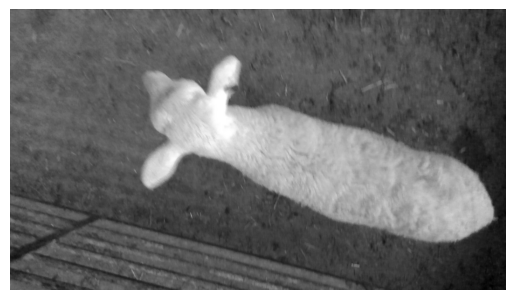

In [56]:
show_image_cv2(image['R'])

A continuación podemos ver como quedaría la visualización de las distintas imagenes.

`image_r` es distinto de `image['R']`. 
* `image_r`: es una imágen con 3 canales, pero hace 0 los canales no deseados
* `image['R']`: es una imágen con 1 canal, que representa la intensidad del canal seleccionado.

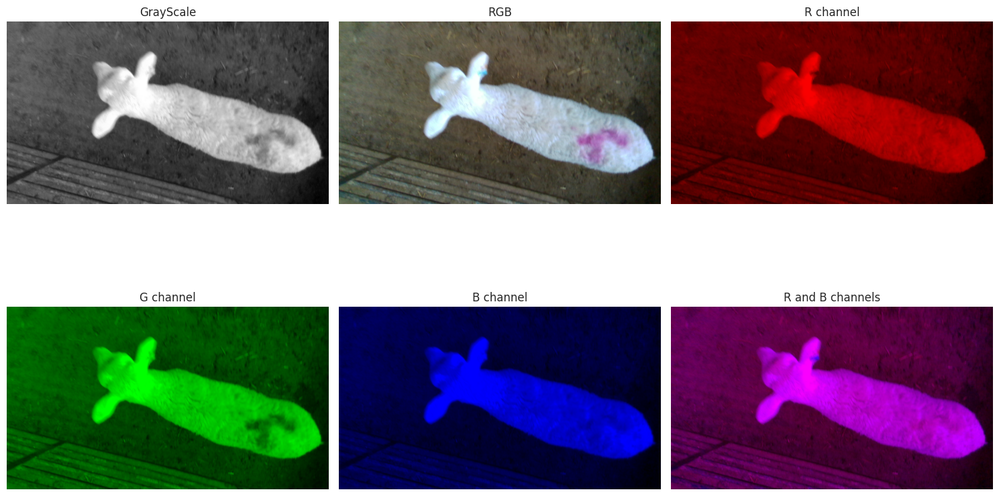

In [57]:
show_set_of_images([img_gray, img_rgb, image_r, image_g, image_b, image_rb],
                     titles=['GrayScale', 'RGB', 'R channel', 'G channel', 'B channel', 'R and B channels'],
                    )

De la visualización de las imágenes de arriba podemos ver que dependiendo de los colores con los que nos queramos quedar, la visualización de las manchas será más o menos visible.

En concreto podemos ver que para la imagen donde solo nos quedamos con el color rojo, la mancha prácticamente ni se nota.

Podemos visualizar un conjunto más grande de los datos

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


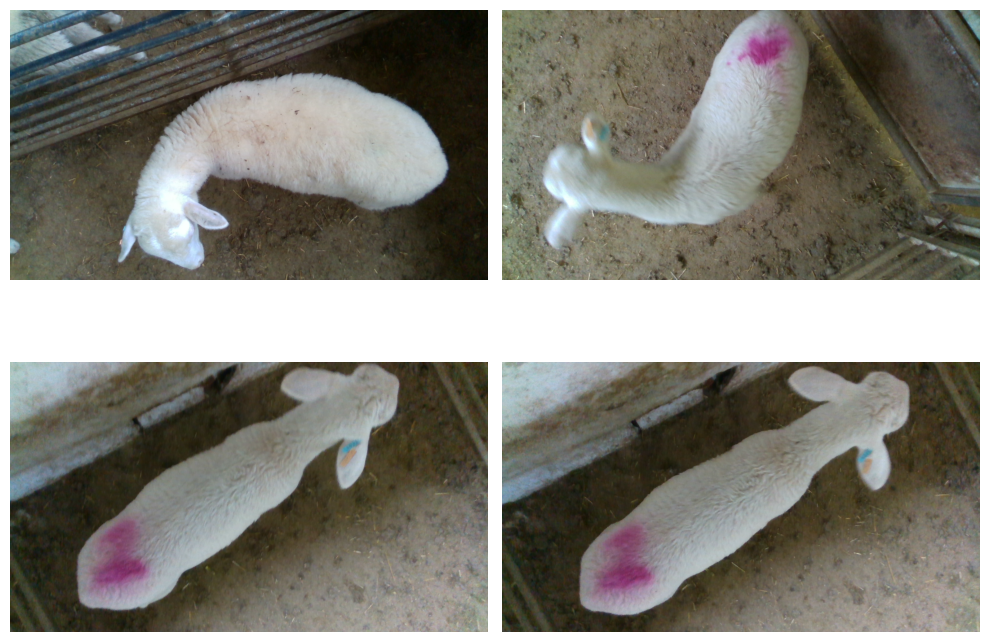

In [58]:
show_N_random_images(path_img, num_images=4)

En las siguientes secciones estudiaremos el histograma, los filtros lineales, no lineales para la primera imagen del array de `list_images`, que nos servirá para sacar unas primeras ideas del dataset, ya que como vimos previamente, todas las imagenes están tomadas desde el zenit y una posición muy similar y cuenta solo con un objeto principal en la imagen.


## Estudio para 1 imagen

### Estudio del histograma

In [59]:
from images_functions.histogram.utils_histograms import (plot_histogram, plot_img_histogram_for_subplot, compare_and_plot_hist_transformations)
from images_functions.histogram.equalized_histogram import equalize_histogram
from images_functions.histogram.clahe import clahe_histogram, study_clahe_parameters

Los histogramas son una representacion de las distribuciones de intensidad de una imagen. Cuantifica el número de pixeles para cada uno de los valores considerados.

Se ha preparado la función de `plot_histogram`, que representa el histograma de una imagen en Gray Scale o RGB. Si la imagen esta en Gray Scale representa la distribución de la intensidad de los grises, mientras que en caso de ser RGB, extrae esto para cada uno de los canales Red, Green and Blue.

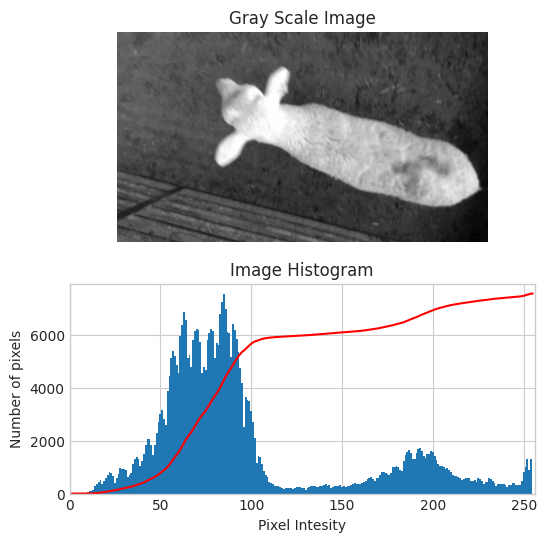

/home/carlos/.local/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


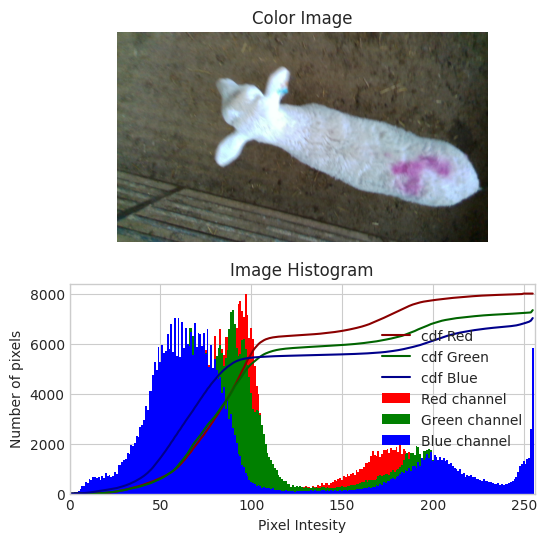

In [60]:
plot_histogram(image['img_gray'])
plot_histogram(image['img_rgb'])

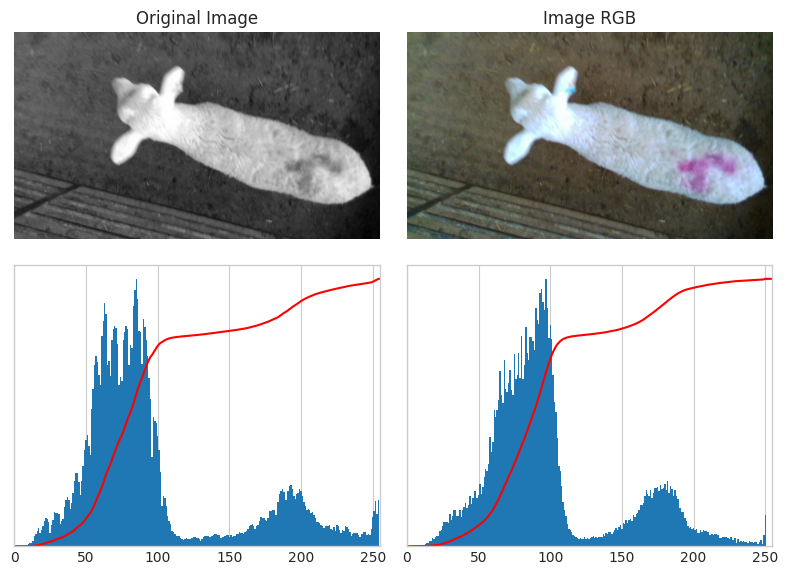

In [61]:
images = [image['img_gray'], image['img_rgb']]
titles_images = ['Original Image', 'Image RGB']
compare_and_plot_hist_transformations(images, titles_images)

El ecualizador implica mapear una distribución del histograma inicial hacia una distribución más uniforme de los valores, tal que todos los valores se extienden a lo largo de todo el rango.

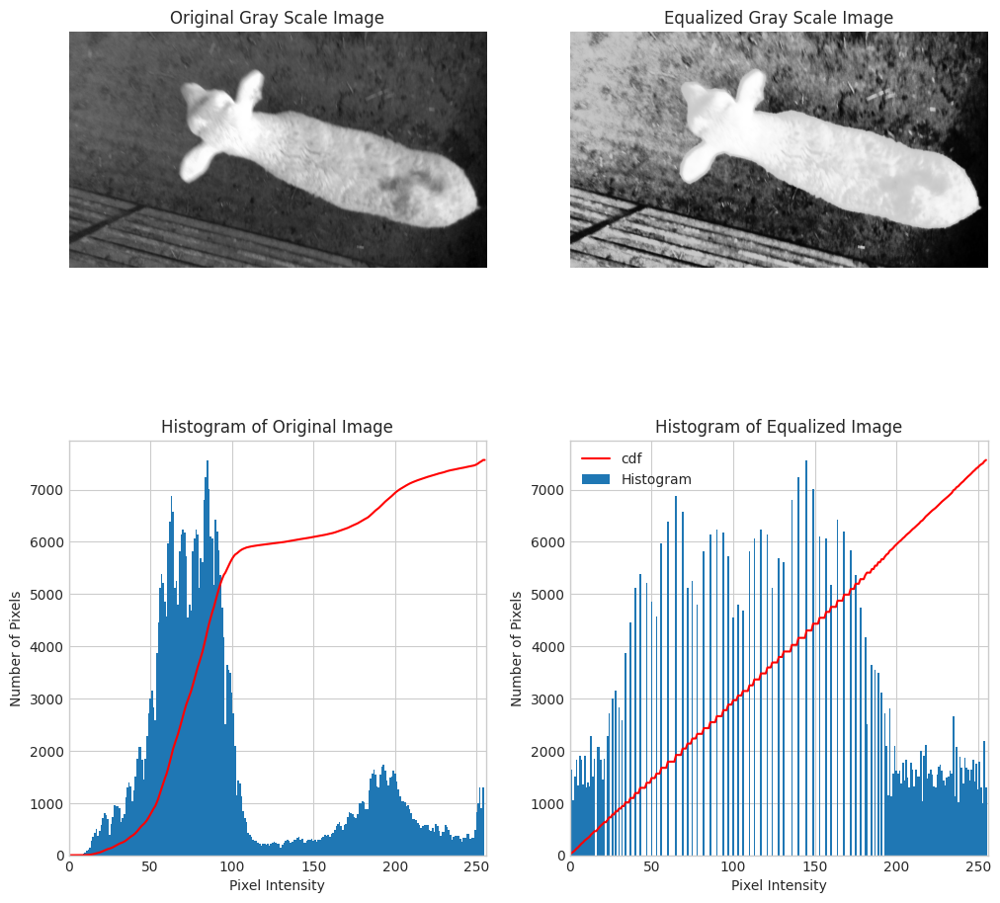

In [64]:
img_gray_equalized = equalize_histogram(image['img_gray'], plot_flag=True)

CLAHE: contrast-limited adaptative histogram equalization.

El método de CLAHE tiene como objetivo aumentar los contrastes de la imagen, empleando la información local. De esta manera se mejora el método del ecualizador planteado anteriormente.

Los pasos que se siguen son:
1. Dividir la imagen en regiones (o bloques) que no solapen. Los bloques tienen una dimensión $NxN$, `tile_grid_size`.
2. Se calcula el histograma para cada uno de los bloques.
3. Para cada pixel de la imagen original, se calcula su posición relativa al bloque que corresponde -> $(s,t)$.
4. Para cada pixel se identifican los 4 bloques que rodean al bloque donde se encuentra este, y extraemos la distribución de sus histogramas: $f_{00}, f_{01}, f_{10}, f_{11}$.
5. Para cada uno de los píxeles se calcula la interpolación bilineal dentro del bloque. Esto asegura que el cambio de contraste entre bloques sea suave y continuo.
6. Aqui es donde aplicamos el ***contrast limiting***, que depende del `clip_limit`, con esto recortamos los hitogramas  en cada bloque, evitando el ampliación excesiva de ruido al restringir la pendiente máxima de las funciones de ecualización

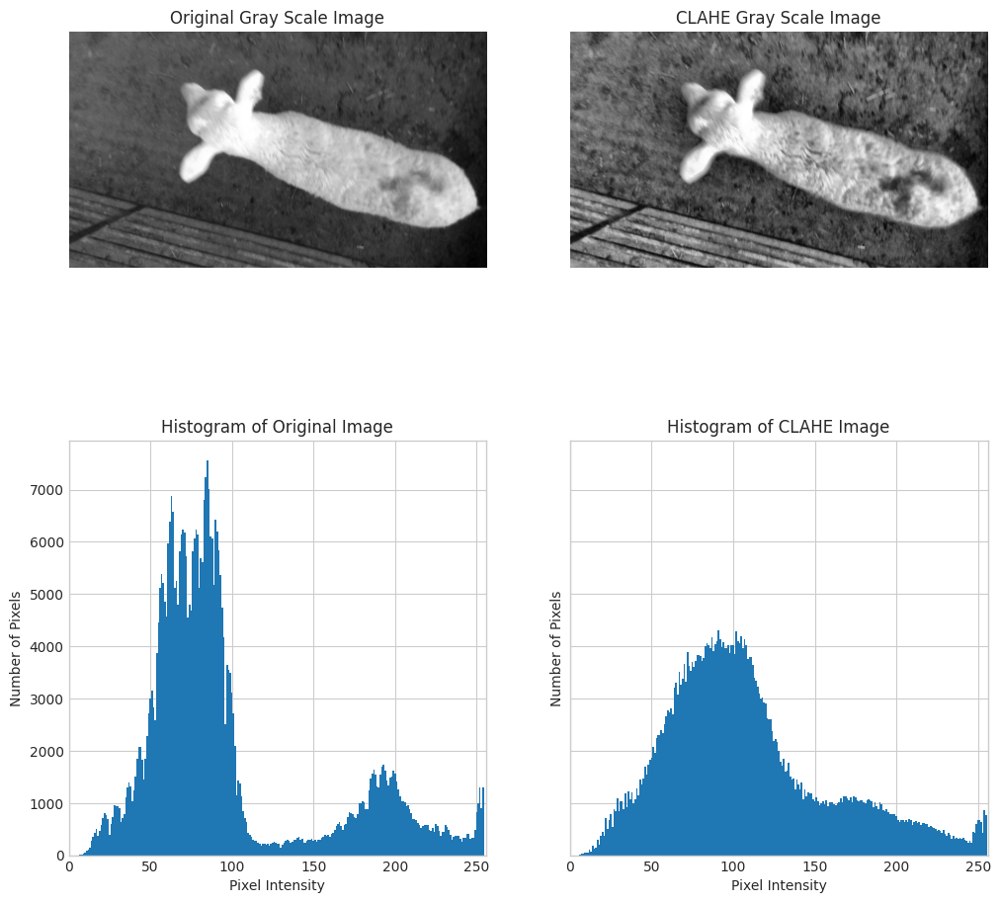

In [63]:
img_gray_clahe = clahe_histogram(image['img_gray'], plot_flag=True)

Aqui mostramos el estudio para diferentes valores de `tile_sizes` y `clip_limits`

In [ ]:
tile_sizes = [2,3, 8, 16]
clip_limits = [1, 2, 3, 4]
clahe_images = study_clahe_parameters(image['img_gray'],tile_sizes, clip_limits)

In [ ]:
images = [image['img_gray'], img_gray_equalized, clahe_images[(2,3)], clahe_images[(4,8)]]
titles_images = ['Original Image', 'Global HE', 'CLAHE Image \n Clip Limit:2, Tile Size: 3x3', 
                 'CLAHE Image \n Clahe Limit:4, Tile Size: 8x8']
compare_and_plot_hist_transformations(images, titles_images)

En esta situación tratamos de buscar la mejor situación que genere un mayor contraste, tal que resalte el contorno de nuestro objeto a segmentar.

En el caso de arriba hemos cogido la imagen en blanco y negro, ahora vamos de manera rápida para ver como se comporta para la imagen donde nos quedemos solo con el canal rojo. (Tenemos que coger solo la Intensidad del color rojo `image_rgb['R']`)

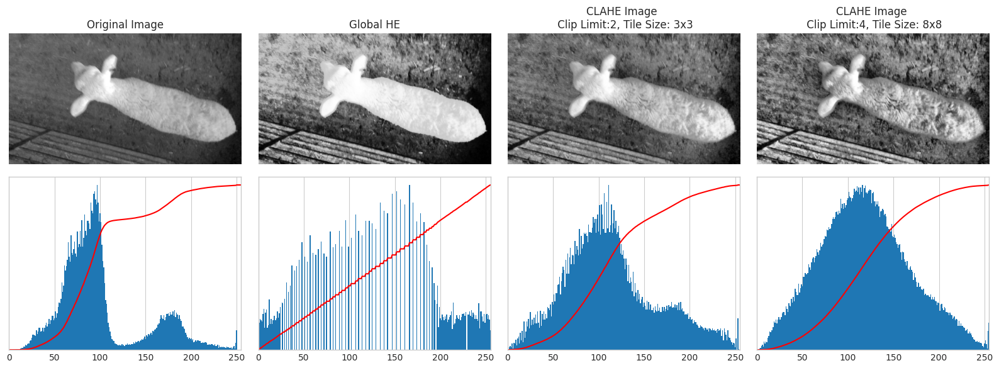

: 

In [ ]:
img_r_equalized = equalize_histogram(image['R'], plot_flag=False)
img_r_clahe = clahe_histogram(image['R'], clip_limit= 2, tile_grid_size=(3,3) , plot_flag= False)
img_r_clahe_2 = clahe_histogram(image['R'], clip_limit= 4, tile_grid_size=(8,8) , plot_flag= False)
images = [image['R'], img_r_equalized, img_r_clahe, img_r_clahe_2]
titles_images = ['Original Image', 'Global HE', 
                 'CLAHE Image \n Clip Limit:2, Tile Size: 3x3',
                 'CLAHE Image \n Clip Limit:4, Tile Size: 8x8']
compare_and_plot_hist_transformations(images, titles_images)

Se ha creado también una función (`pipeline_preprocess_img`) que pretende facilitar y automatizar las pruebas del preprocesamiento de las imágenes.

Esta función necesita:
* `img`: una imagen de entrada en escala de grises, o solo uno de los canales de la imagen.
* `steps`: los pasos a seguir de manera **secuencial**.
    ```python
    steps=[
        (Name_function_0), "Representation Name 0", {'param1': value_param1, ...}, #Step0 
        (Name_function_1), "Representation Name 1", {'param1': value_param1, ...}, #Step1
        ...
    ]
    ```
* `plot_flag`: te muestra un subplot de los pasos intermedios.

La función devuelve el resultado final y los pasos intermedios con sus respectivas imagenes.

**¡¡Importante!!** el orden de los STEPS es importante, altera el resultado.

In [ ]:
from images_functions.pipeline.preprocess_pipeline import pipeline_preprocess_img
from images_functions.data_io.read_imgs_directory import list_images_in_directory

img_path = 'VICO_lamb/color'
list_imgs = list_images_in_directory(img_path)
img_selected = list_imgs[10]
image = decompose_image_channels(img_selected)

img = image['img_gray']
steps = [
    (equalize_histogram, "Equalized Histogram" ,{}),
    (clahe_histogram, "CLAHE", {"clip_limit": 2.0, "tile_grid_size": (8, 8)})
]

result_img, intemediates = pipeline_preprocess_img(img=img, steps=steps, plot_flag=True)

### Filtros lineales

In [ ]:
from images_functions.linear_filters.box_filter import box_filter, study_box_filter
from images_functions.linear_filters.gaussian_filter import gaussian_filter, study_gaussian_filter
from images_functions.linear_filters.sobel_filter import sobel_filter, study_sobel_filter
from images_functions.linear_filters.laplacian_filter import laplacian_filter, study_laplacian_filter
from images_functions.linear_filters.scharr_filter import scharr_filter, study_scharr_filter

En esta sección buscamos aplicar filtros lineales a las imagenes.

El primer método empleado es el ***box filter*** o también conocido como ***Average Filter*** que pretende suaviazar la imagen mediante el cálculo del valor medio de los vecinos de un píxel. Esto nos ayuda a **reducir ruido**. 

Se puede determinar el tamaño de la matriz (`kernel_size`) que determina, "cuantos vecinos cogemos". 

In [ ]:
box_filtered_img = study_box_filter(image['img_gray'], kernel_sizes = [3,4,8,], plot_flag=True)

El **Gaussian Filter** también se emplea para reducir el ruido y suavizar la imagen.

Ventajas:
* **Effective Noise Reduction**: reduce ruido aleatorio de manera efectiva.
* **Blurring**: Desenfoca la imagen para resaltar los detalles a gran escala.
* **Separable Filter**: Se puede descomponer en dos filtros de 1D, que simplifica la computación. 

In [ ]:
gaussian_filtered_img = study_gaussian_filter(image['img_gray'], alpha_values=[1,1.5, 3], plot_flag=True)

**Sobel Filter** (Edge Detection) se emplea para detectar bordes mediante aproximación del gradiente de la intensidad de la imagen. Son muy útiles para la detección de bordes en direcciones horizontales y verticales.

Se calculan los gradientes horizontales y verticales, y luego se calcula:
* La magnitud del gradiente: $G=\sqrt(G^2_x,G^2_y)$
* Dirección del gradiente: $\theta=arctang(G_y/G_x)$

In [ ]:
sober_filtered_img = study_sobel_filter(image['img_gray'], kernel_sizes=[3,5,7], ddepth = cv2.CV_16S ,plot_flag=True)

**Laplacian Filter** también es comunmente empleado para la detección de bordes, donde emplea la segunda deriviada de la intensidad de la imagen. Sobresalta aquellas regiones que tienen rapidas variaciones.

In [ ]:
sober_filtered_img_64F = study_sobel_filter(image['img_gray'], kernel_sizes=[3,5,7], ddepth = cv2.CV_64F ,plot_flag=True)

In [ ]:
laplacian_img_filtered = study_laplacian_filter(image['img_gray'], kernel_sizes=[3,5,7], ddepth = cv2.CV_16S, plot_flag=True)

In [ ]:
laplacian_img_filtered_64 = study_laplacian_filter(image['img_gray'], kernel_sizes=[3,5,7], ddepth = cv2.CV_64F, plot_flag=True)

**Scharr Filter** es una mejora del filtro de Sober, también empleado para detectar los bordes de una imagen.

In [ ]:
scharr_img_filtered = study_scharr_filter(image['img_gray'], ddepth = cv2.CV_16S, plot_flag=True)

Podriamos realizar el estudio para la imagen solo con el canal Red, pero hemos visto que los filtros de detección de bordes no son sensibles a las manchas de la oveja 

A continuación podemos ver brevemente como sería el efecto introduciendo el pipeline, con CLAHE y el filtro de Laplacian. (Se pueden probar otros filtros y otros ordenes).


In [ ]:
from images_functions.pipeline.preprocess_pipeline import pipeline_preprocess_img
from images_functions.data_io.read_imgs_directory import list_images_in_directory

img_path = 'VICO_lamb/color'
list_imgs = list_images_in_directory(img_path)
img_selected = list_imgs[10]
image = decompose_image_channels(img_selected)

img = image['img_gray']

# steps = [
#     (clahe_histogram, "CLAHE", {"clip_limit": 2.0, "tile_grid_size": (8, 8)}),
#     (laplacian_filter, "Laplacian Filter", {"kernel_size": 3}),
# ]
# steps = [
#     (laplacian_filter, "Laplacian Filter", {"kernel_size": 3}),
#     (clahe_histogram, "CLAHE", {"clip_limit": 2.0, "tile_grid_size": (8, 8)}),
# ]
steps = [
    (scharr_filter, "Scharr Filter", {}),
    (clahe_histogram, "CLAHE", {"clip_limit": 2.0, "tile_grid_size": (8, 8)}),
]

result_img, intermediates = pipeline_preprocess_img(img=img, steps=steps, plot_flag=True)

### Filtros no lineales

In [ ]:
from images_functions.non_linear_filters.median_filter import median_filter, study_median_filter
from images_functions.non_linear_filters.bilateral_filter import bilateral_filter, study_bilateral_filter

Al igual que en la sección anterior en esta vamos a calcular a emplear los filtros no lineales.

**Median Filter** cada pixel se sutituye por el valor de la mediana de sus vecinos.

In [ ]:
median_filtered_img = study_median_filter(image['img_gray'], kernel_sizes=[3,5,7], plot_flag=True)

**Bilateral Filter** es un filtro no lineal que conserva los bordes y se utiliza para reducir el ruido. Este filtro considera tanto la proximidad espacial como la similitud de intensidad.

In [ ]:
bilateral_filtered_img = study_bilateral_filter(image['img_gray'], d_values=[3,5,5,9,13], sigma_colors=[75,75,150,150,250], sigma_spaces=[75,75,150,150,250], pair_mode = True, plot_flag=True)

Volvemos a probar el pipeline combinando equalizador, filtro lineal y filtro no lineal. Se puede combinar filtros y orden de steps.

In [ ]:
from images_functions.pipeline.preprocess_pipeline import pipeline_preprocess_img
from images_functions.data_io.read_imgs_directory import list_images_in_directory

img_path = 'VICO_lamb/color'
list_imgs = list_images_in_directory(img_path)
img_selected = list_imgs[10]
image = decompose_image_channels(img_selected)

img = image['img_gray']

steps = [
    # (clahe_histogram, "CLAHE", {"clip_limit": 2.0, "tile_grid_size": (8, 8)}),
    (laplacian_filter, "Laplacian Filter", {"kernel_size": 3}),
    (bilateral_filter, "Bilateral Filter", {"d": 5, "sigma_color":75, "sigma_space":75}),
]
# steps = [
#     # (clahe_histogram, "CLAHE", {"clip_limit": 2.0, "tile_grid_size": (8, 8)}),
#     (bilateral_filter, "Bilateral Filter", {"d": 5, "sigma_color":75, "sigma_space":75}),
#     (scharr_filter, "Scharr Filter", {}),
# ]

result_img, intermediates = pipeline_preprocess_img(img=img, steps=steps, plot_flag=True)

### Comparación de filtros

Aqui vamos a comparar cada uno de los filtros aplicado directamente sobre la imagen original en la escala de grises, incluso podríamos incluir los pipeline probados previamente creados.

In [ ]:
import matplotlib.pyplot as plt

# Compare filters
images = {
    'Original Image': image['img_gray'],
    'Box Filter \n(3x3)': box_filtered_img[3],
    'Gaussian Filter \n(3x3)': gaussian_filtered_img[1],
    'Sober Filter \n(3x3)': sober_filtered_img[3],
    'Laplacian Filter \n(3x3)': laplacian_img_filtered[3],
    'Scharr Filter \n(3x3)': scharr_img_filtered[3],
    'Median Filter \n(3x3)': median_filtered_img[3],
    'Bilateral Filter \n(d=5, σc=75, σs=75)': bilateral_filtered_img[(5,75,75)],
}

fig, axs = plt.subplots(2, 4, figsize=(20, 10))
for i, (title, im) in enumerate(images.items()):
    ax = axs[i // 4, i % 4]
    ax.imshow(im, cmap='gray')
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
set_images = []
set_titles = []
for title in images.keys():
    set_titles.append(title)
    set_images.append(images[title])
compare_and_plot_hist_transformations(set_images, set_titles)

### Image Binarization

In [ ]:
from images_functions.image_binarization.thresholding import (  img_binarization,
                                                                study_img_binarization,
                                                                img_adaptive_binarization,
                                                                study_img_adaptive_binarization
                                                              )

De momento tratando de mantener todos los ejemplos, el siguiente paso es la extracción de los contornos de las imágenes, para ello vamos a emplear la binarización de las imágenes.

Hay diferentes maneras de extraer la binarización de las imagenes:
* `img_binarization`: donde empleamos la binarización de cv2, donde nos devuelve dos imágenes binarizadas, cada una con un threshold diferente, `cv2.THRESH_BINARY` y otra con `cv2.THRESH_BINARY + cv2.THRESH_OTSU`.
* `img_adaptative_binarization`: donde se emplea una binarización adaptativa, donde se va determinando el umbral de un pixel en base a sus píxeles vecinos.

In [ ]:
image_binarized, image_binarized_otsu = study_img_binarization(image['R'], plot_flag=True, image_title = 'Original Image')
image_binarized_mean, image_binarized_gaussian = study_img_adaptive_binarization(image['R'], block_size = [3,11, 15],plot_flag=True, image_title = 'Original Image')

Luego procedemos al estudio de las diferentes operaciones morfológicas que podemos aplicar a la imagen binarizada.

In [ ]:
from images_functions.image_binarization.morphology_operations import morphology_operations, study_morphology_operations

In [ ]:
result_morphology = study_morphology_operations(image_binarized, kernel_size=(5,5), iterations=1, plot_flag=True)

### Extraer contornos

Ahora a partir de una imagen binarizada, podemos extraer sus contornos, y para ello podemos emplear la imagen original o alguna de las resultantes tras haber aplicado alguna operación morfológica.

In [ ]:
from images_functions.image_binarization.contour_analysis import find_contours_img_binarization

In [ ]:
contours, centroids, areas, bounding_boxes, contour_masks, filtered_bin_img = find_contours_img_binarization(image['img_gray'], 
                                                                                            image_binarized,
                                                                                            plot_flag=True)

Como podemos observar en la imágen hay muchos objetos que se seleccionan como contornos, y tenemos dos opciones, como sabemos que en el dataset de imagenes que tenemos solo hay una oveja por imagen, nos podemos quedar con el cotorno más grande o generalizando de otra manera, quedándonos con aquellos contornos que tengan un area mayor que un cierto umbral.

 

Si se quiere quedar con el que tiene un mayor area basta con activar el siguiente flag `area_max`.

In [ ]:
contours, centroids, areas, bounding_boxes, contour_masks_fil, filtered_bin_img = find_contours_img_binarization(image['img_gray'], 
                                                                                            image_binarized,
                                                                                            area_max = True,
                                                                                            plot_flag=True)

Continuando con la idea de emplear un filtrado de areas se ha implementado el parámetro `area_realtive_min`que solo se queda con el conjunto de areas mayores que este umbral. Se ha seleccionado un el Area Relativa para que sea agnóstico al tamamño de la imagen.

In [ ]:
contours, centroids, areas, bounding_boxes, contour_masks, filtered_bin_img = find_contours_img_binarization(image['img_gray'], 
                                                                                            image_binarized,
                                                                                            area_relative_min = 0.01,
                                                                                            plot_flag=True)

Como podemos observar en el problema que se enfrenta en esta práctica, al conocer que solo habrá una objea por imagen interesa más limitarlo solo a quedarnos con la que tenga un contorno más grande

También se puede aplicar el pipeline en este proceso, no hay una solución unica que de buenos resultados para todos los problemas, ni para todas las imágenes de un dataset, la idea sería ir probando

In [ ]:
from images_functions.pipeline.preprocess_pipeline import pipeline_preprocess_img
from images_functions.data_io.read_imgs_directory import list_images_in_directory

img_path = 'VICO_lamb/color'
list_imgs = list_images_in_directory(img_path)
img_selected = list_imgs[10]
image = decompose_image_channels(img_selected)


# steps = [
#     (img_binarization, "Image Binarization", {}),
# ]
# steps = [
#     (img_binarization, "Image Binarization", {}),
#     (gaussian_filter, "Gaussian filter", {}),
#     (morphology_operations, "Morphology Operation Dilated", {'operation':'dilate'}),
#     (morphology_operations, "Morphology Operation Eroded", {'operation':'erode'}),
#     (laplacian_filter, "Laplacian Filter", {"kernel_size": 3}),
# ]

# steps = [
#     (gaussian_filter, "Gaussian filter", {}),
#     (img_binarization, "Image Binarization", {}),
# ]
steps = [
    (clahe_histogram, "CLAHE", {}),
    (img_binarization, "Image Binarization", {}),
    (morphology_operations, "Morphology Operation Dilated", {'operation':'dilate'}),
    (morphology_operations, "Morphology Operation Eroded", {'operation':'erode'}),
]

result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=steps, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_relative_min=0.01)

### Evaluations

Para evaluar la segmentación de una imagen se emplea IoU, Intersection Over Union. 

Donde para un objeto tenemos su etiqueta (mask_gt) y su predicción (mask_pred) y el IoU se calcula como:
$$
IoU = \frac{mask_{gt} \cap mask_{pred} }{mask_{gt} \cup mask_{pred} }
$$

Esta formula de aqui arriba se puede realizar sobre la máscara de la etiqueta y sobre la imágen original. Limitaciones: cuando la imagen pasa por algun filtro como laplacian que te quedas solo con los bordes, si lo comparas directamente con la imagen etiqueta, te van a salir valores no representativos.

De manera adicional, y para solventar la limitación de arriba, aunque en este dataset se cuente con un objeto, se debe generalizar el cálculo del Iou para los casos que en una imagen haya varios objetos y por tanto varias etiquetas y varias predicciones. Para ello, lo que se hace es calcular una matriz $IoU$, donde para cada objeto, $j$,  se calcula su $IoU_{i,j}$ con cada predicción, $i$.

El siguiente paso es centrarnos en aquellos valores mayores que un umbral $IoU_{threshold}$ (Greedy search, el Hungarian search es más óptimo, pero no lo he planteado en este caso). Por tanto, tenemos ahora una segunda matriz con aquellos IoU que nos debemos fijar.
Como para cada objeto se espera tener una predicción, lo que se hace ahora es ordenar los IoU y de manera progresiva vamos viendo a que mask_gt y mask_pred pertenece, tal que vamos a ir apuntando cuales se han ido utilizando y asi evitamos "volver a seleccionarlos".

En esta práctica, para evaluar las imagenes, tenemos que compararlo con las etiquetas de la carpeta `VICO_lamb/mask`

In [ ]:
label_list = list_images_in_directory('VICO_lamb/mask')
label_img = label_list[10]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)

Visualizamos la imagen de la mascara

In [ ]:
show_image_cv2(label_gray)

Obtenemos su binarización y obtenemos su contorno y mascara.

In [ ]:
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _= find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=True,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    

Hay diferentes maneras de realizar el cálculo

In [ ]:
from images_functions.evaluate_segmentations.evaluation_masks import cm_binary_imgs, visualize_segmentation_confusion, masks_iou, visualize_iou

Obteniendo los resultados a partir de la binarización de la imagen etiqueta y la preprocesada. 

In [ ]:
results = cm_binary_imgs(img_binarized_label, image_binarized)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, image_binarized)

Si calculamos el IoU a partir de las máscaras de los contornos, es decir, el IoU por objeto y predicción.

In [ ]:
matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)

## Estudio para el dataset completo

In [3]:
import cv2, os, json
import matplotlib.pyplot as plt

from images_functions.data_io.read_data import read_image_from_cv2
from images_functions.data_io.read_imgs_directory import list_images_in_directory
from images_functions.data_io.save_data import save_image_cv2

from images_functions.visualization.plot_images import (
    show_image_cv2,
    show_set_of_images,
    show_N_random_images,
)

from images_functions.utils.extract_channels import (
    decompose_image_channels,
    extract_rgb_channels,
)

from images_functions.histogram.utils_histograms import (
    plot_histogram,
    plot_img_histogram_for_subplot,
    compare_and_plot_hist_transformations,
)
from images_functions.histogram.equalized_histogram import equalize_histogram
from images_functions.histogram.clahe import (
    clahe_histogram,
    study_clahe_parameters,
)

from images_functions.pipeline.preprocess_pipeline import pipeline_preprocess_img

from images_functions.linear_filters.box_filter import box_filter, study_box_filter
from images_functions.linear_filters.gaussian_filter import gaussian_filter, study_gaussian_filter
from images_functions.linear_filters.sobel_filter import sobel_filter, study_sobel_filter
from images_functions.linear_filters.laplacian_filter import laplacian_filter, study_laplacian_filter
from images_functions.linear_filters.scharr_filter import scharr_filter, study_scharr_filter

from images_functions.non_linear_filters.median_filter import median_filter, study_median_filter
from images_functions.non_linear_filters.bilateral_filter import bilateral_filter, study_bilateral_filter


from images_functions.image_binarization.thresholding import (
    img_binarization,
    study_img_binarization,
    img_adaptive_binarization,
    study_img_adaptive_binarization,
)
from images_functions.image_binarization.morphology_operations import (
    morphology_operations,
    study_morphology_operations,
)
from images_functions.image_binarization.contour_analysis import find_contours_img_binarization
from images_functions.evaluate_segmentations.evaluation_masks import masks_iou, visualize_iou, cm_binary_imgs, visualize_segmentation_confusion
from images_functions.pipeline.pipeline_dataset import run_pipeline
from images_functions.pipeline.preprocess_pipeline import pipeline_preprocess_img



### Pipeline 0

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


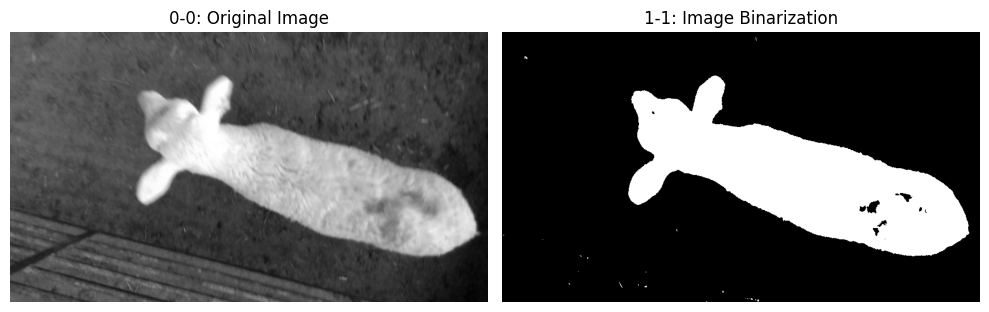

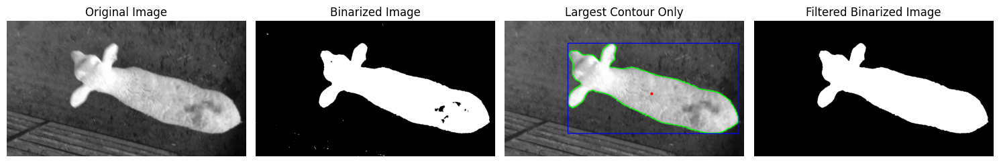

The directory VICO_lamb/mask, contains 24 images
All images have the same spatial size: (480, 848)


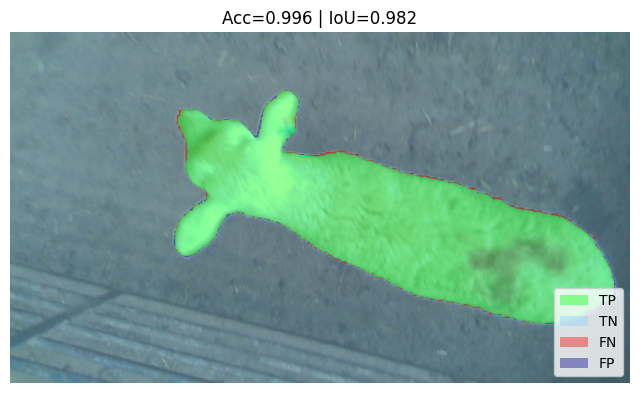

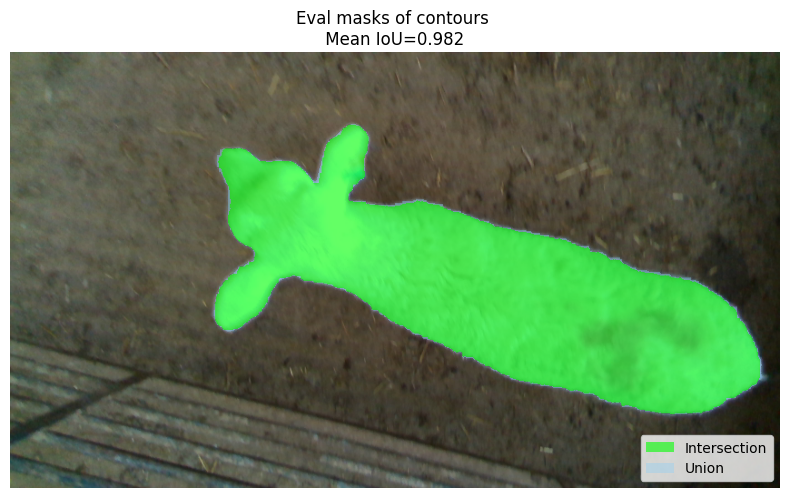

In [52]:

img_path = 'VICO_lamb/color'
list_imgs = list_images_in_directory(img_path)
idx = 10
img_selected = list_imgs[idx]
image = decompose_image_channels(img_selected)


pipeline_0 = [
    (img_binarization, "Image Binarization", {}),
]


result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=pipeline_0, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_max = True,
                                          area_relative_min=0.0)


label_list = list_images_in_directory('VICO_lamb/mask')
label_img = label_list[idx]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _ = find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=False,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    
results = cm_binary_imgs(img_binarized_label, result_img)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, result_img)  

matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)

In [53]:
img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'

steps = [
    (img_binarization, "Image Binarization", {}),
]

step_name = 'Pipeline_0'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=steps,
    area_max = False,
    area_relative_min = 0.0,
    step_name=step_name,
    plot_flag=False
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_0: 100%|██████████| 24/24 [01:03<00:00,  2.63s/image]


In [54]:
img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'

steps = [
    (img_binarization, "Image Binarization", {}),
]

step_name = 'Pipeline_0_a_max'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=steps,
    area_max = True,
    area_relative_min = 0.0,
    step_name=step_name,
    plot_flag=False
)

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_0_a_max: 100%|██████████| 24/24 [00:59<00:00,  2.47s/image]


In [55]:
img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'

steps = [
    (img_binarization, "Image Binarization", {}),
]

step_name = 'Pipeline_0_a_min_th'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=steps,
    area_max = False,
    area_relative_min = 0.05,
    step_name=step_name,
    plot_flag=False
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_0_a_min_th: 100%|██████████| 24/24 [00:36<00:00,  1.53s/image]


In [56]:
img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'

steps = [
    (img_binarization, "Image Binarization", {}),
]

step_name = 'Pipeline_0_a_max_red'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=steps,
    area_max = True,
    area_relative_min = 0.0,
    step_name=step_name,
    channel_img = 'R',
    plot_flag=False
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_0_a_max_red: 100%|██████████| 24/24 [00:35<00:00,  1.48s/image]


### Pipeline 1

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


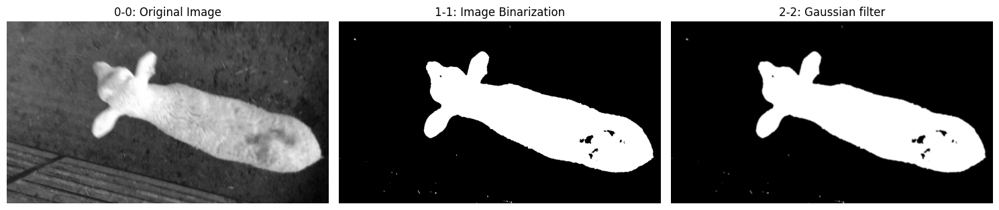

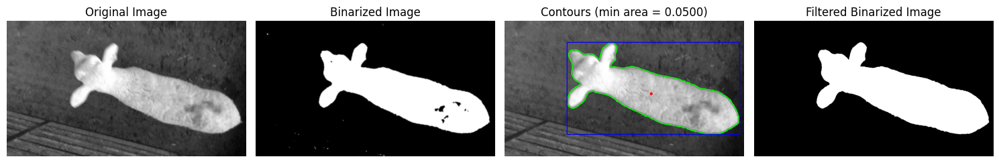

The directory VICO_lamb/mask, contains 24 images
All images have the same spatial size: (480, 848)


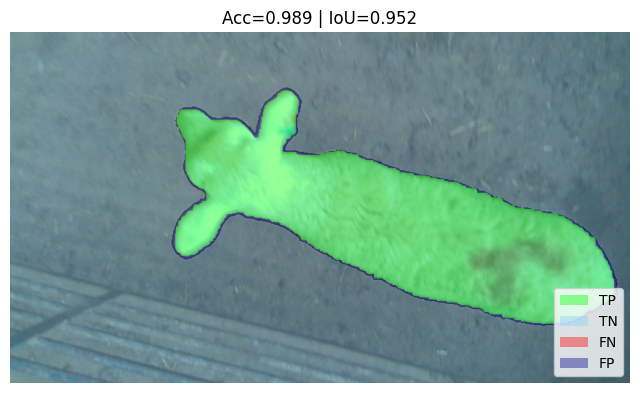

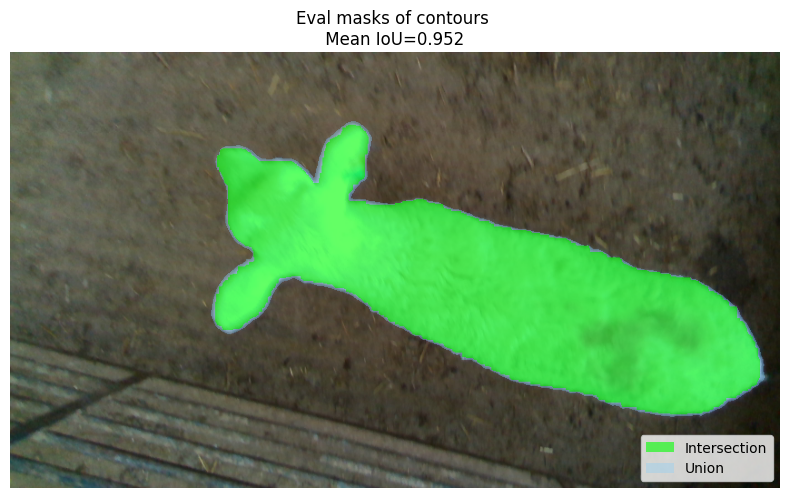

In [16]:

img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'
list_imgs = list_images_in_directory(img_path)
idx = 10
img_selected = list_imgs[idx]
image = decompose_image_channels(img_selected)


pipeline_1 = [
    (img_binarization, "Image Binarization", {}),
    (gaussian_filter, "Gaussian filter", {}),
]


result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=pipeline_1, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_max = False,
                                          area_relative_min=0.05)


label_list = list_images_in_directory(img_path_label)
label_img = label_list[idx]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _= find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=False,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    
results = cm_binary_imgs(img_binarized_label, result_img)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, result_img)    
matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)                                      

In [7]:
step_name = 'Pipeline_1'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=pipeline_1,
    step_name=step_name,
    area_relative_min=0.0,
    area_max=True,
    plot_flag=False
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_1: 100%|██████████| 24/24 [01:07<00:00,  2.83s/image]


### Pipeline 2

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


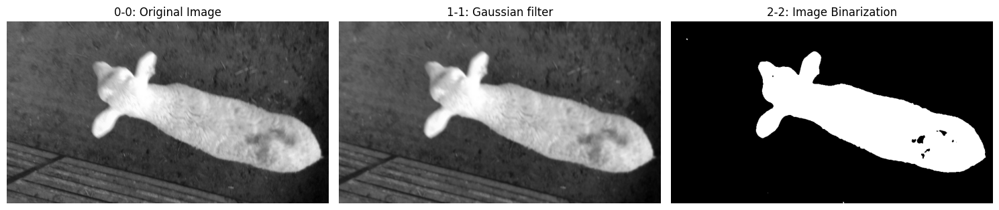

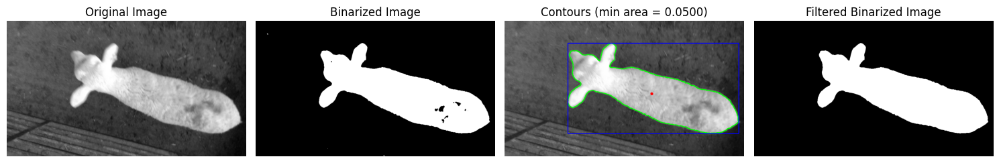

The directory VICO_lamb/mask, contains 24 images
All images have the same spatial size: (480, 848)


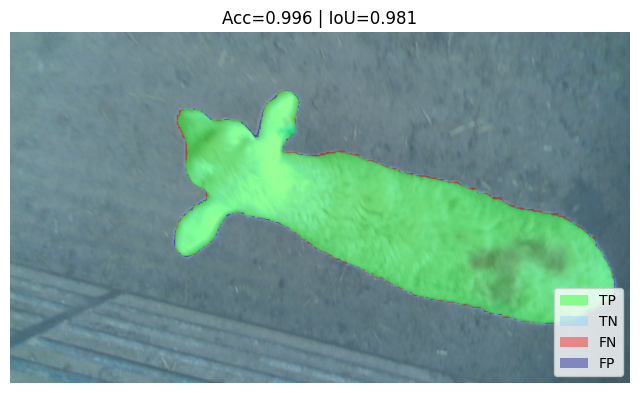

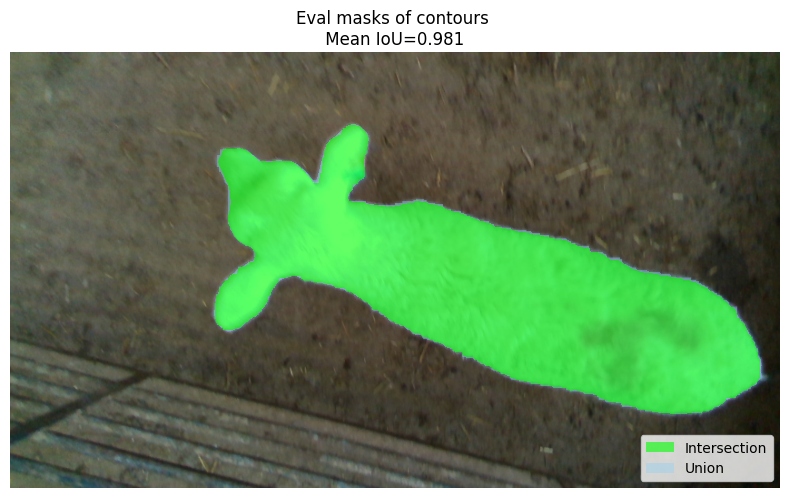

In [ ]:

img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'
list_imgs = list_images_in_directory(img_path)
idx = 10
img_selected = list_imgs[idx]
image = decompose_image_channels(img_selected)


pipeline_2 = [
    (gaussian_filter, "Gaussian filter", {}),
    (img_binarization, "Image Binarization", {}),
]


result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=pipeline_2, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_max = True,
                                          area_relative_min=0.0)


label_list = list_images_in_directory(img_path_label)
label_img = label_list[idx]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _= find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=False,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    
results = cm_binary_imgs(img_binarized_label, result_img)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, result_img)    
matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)                                      

In [18]:
step_name = 'Pipeline_2'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=pipeline_2,
    step_name=step_name,
    area_relative_min=0.0,
    area_max=True,
    plot_flag=False,
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_2: 100%|██████████| 24/24 [01:39<00:00,  4.16s/image]


### Pipeline 3

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


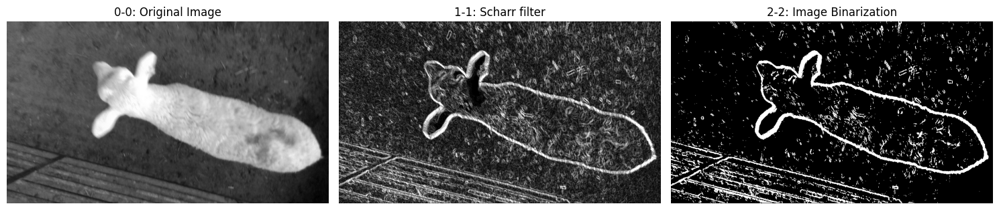

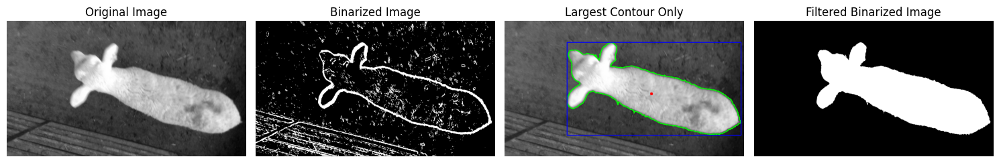

The directory VICO_lamb/mask, contains 24 images
All images have the same spatial size: (480, 848)


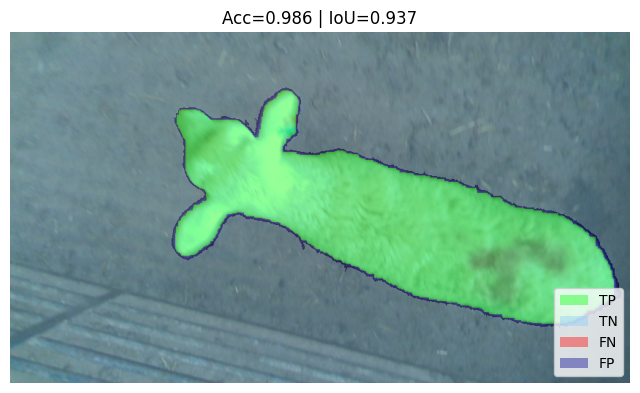

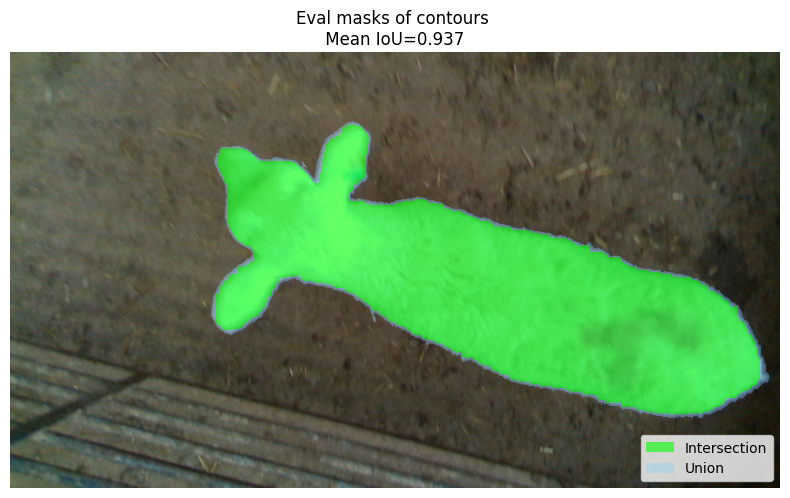

In [19]:

img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'
list_imgs = list_images_in_directory(img_path)
idx = 10
img_selected = list_imgs[idx]
image = decompose_image_channels(img_selected)


pipeline_3 = [
    (scharr_filter, "Scharr filter", {}),
    (img_binarization, "Image Binarization", {}),
]


result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=pipeline_3, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_max = True,
                                          area_relative_min=0.0)


label_list = list_images_in_directory(img_path_label)
label_img = label_list[idx]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _= find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=False,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    
results = cm_binary_imgs(img_binarized_label, result_img)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, result_img)    
matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)                                      

In [20]:
step_name = 'Pipeline_3'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=pipeline_3,
    step_name=step_name,
    area_relative_min=0.0,
    area_max=True,
    plot_flag=False,
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_3: 100%|██████████| 24/24 [01:00<00:00,  2.52s/image]


### Pipeline 4

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


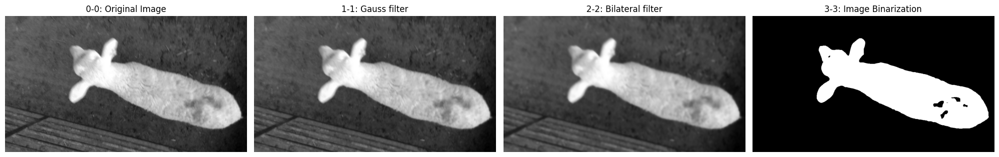

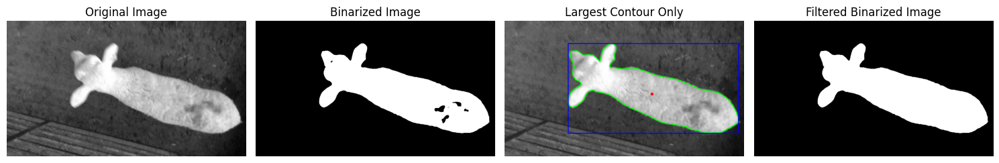

The directory VICO_lamb/mask, contains 24 images
All images have the same spatial size: (480, 848)


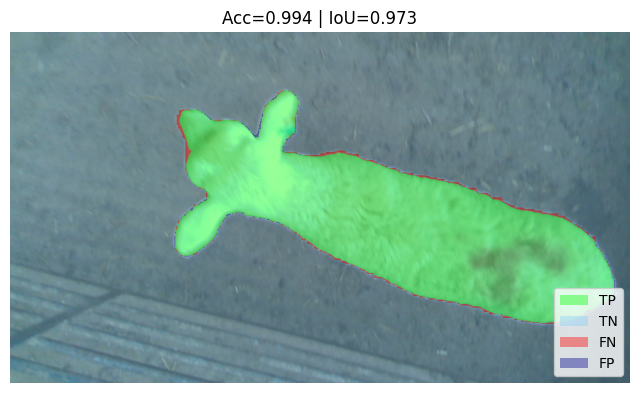

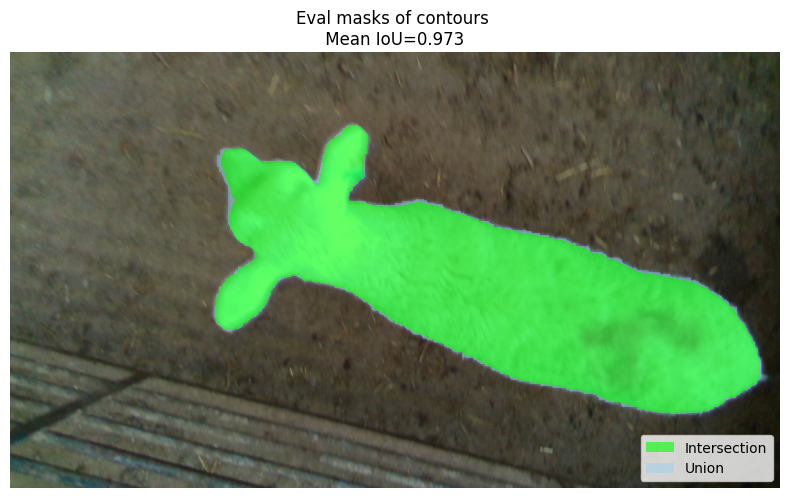

In [40]:

img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'
list_imgs = list_images_in_directory(img_path)
idx = 10
img_selected = list_imgs[idx]
image = decompose_image_channels(img_selected)


pipeline_4 = [
    (gaussian_filter, "Gauss filter", {}),
    (bilateral_filter, "Bilateral filter", {}),
    (img_binarization, "Image Binarization", {'use_otsu':True}),
]


result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=pipeline_4, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_max = True,
                                          area_relative_min=0.0)


label_list = list_images_in_directory(img_path_label)
label_img = label_list[idx]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _= find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=False,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    
results = cm_binary_imgs(img_binarized_label, result_img)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, result_img)    
matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)                                      

In [41]:
step_name = 'Pipeline_4'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=pipeline_4,
    step_name=step_name,
    area_relative_min=0.0,
    area_max=True,
    plot_flag=False,
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_4: 100%|██████████| 24/24 [00:46<00:00,  1.93s/image]


### Pipeline 5

The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)


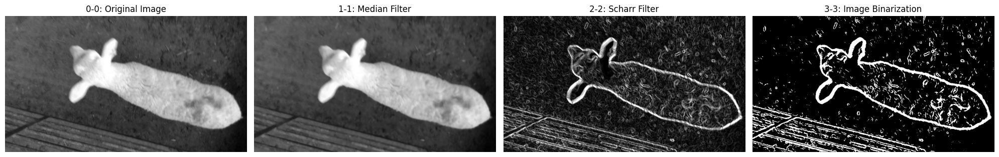

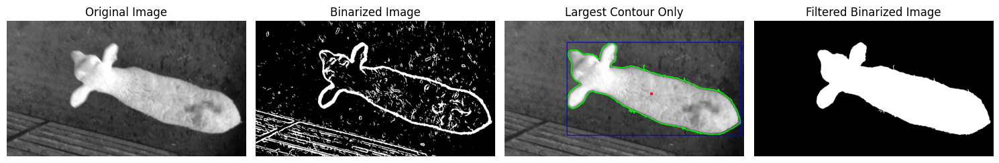

The directory VICO_lamb/mask, contains 24 images
All images have the same spatial size: (480, 848)


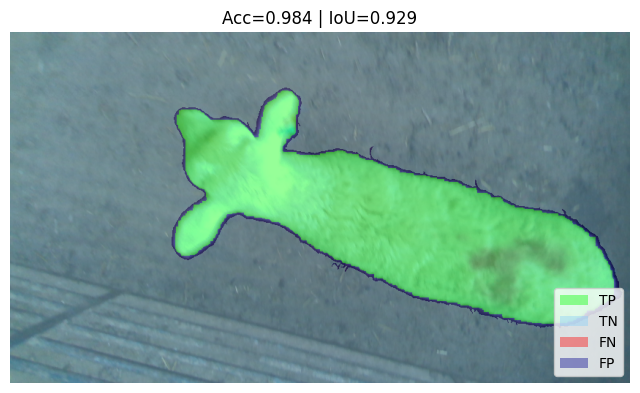

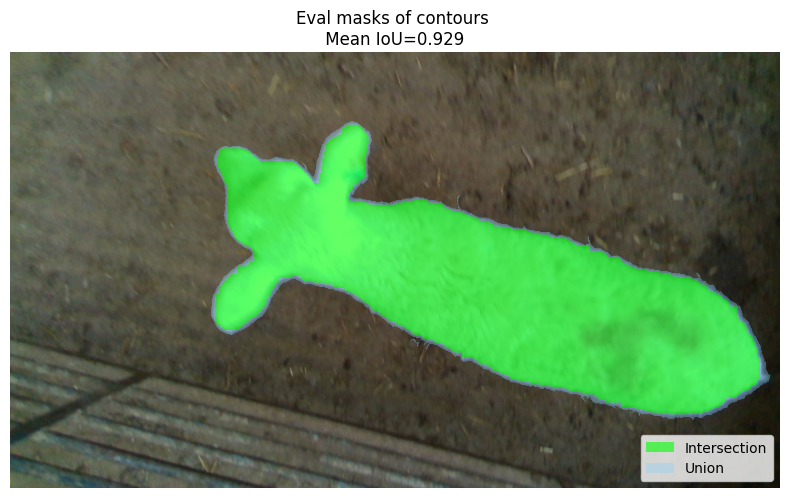

In [32]:

img_path = 'VICO_lamb/color'
img_path_label = 'VICO_lamb/mask'
list_imgs = list_images_in_directory(img_path)
idx = 10
img_selected = list_imgs[idx]
image = decompose_image_channels(img_selected)


pipeline_5 = [
    (median_filter, "Median Filter", {"kernel_size":5}),
    (scharr_filter, "Scharr Filter", {}),
    (img_binarization, "Image Binarization", {'use_otsu':True}),
]


result_img, intermediates = pipeline_preprocess_img(img=image['img_gray'], steps=pipeline_5, plot_flag=True)
contours, centroids, areas, bounding_boxes, contour_masks, result_img = find_contours_img_binarization(image['img_gray'], 
                                          result_img,
                                          plot_flag=True, 
                                          area_max = True,
                                          area_relative_min=0.0)


label_list = list_images_in_directory(img_path_label)
label_img = label_list[idx]
label_gray = read_image_from_cv2(label_img, cv2.IMREAD_GRAYSCALE)
img_binarized_label = img_binarization(label_gray)
contours_label, centroids_label, areas_label, bounding_boxes_label, contour_masks_label, _= find_contours_img_binarization(label_gray,
                                                                                                                        img_binarized_label,
                                                                                                                        plot_flag=False,
                                                                                                                        image_title = 'Label Image',
                                                                                                                        binarized_image_title = 'Binarized Image')
    
results = cm_binary_imgs(img_binarized_label, result_img)
visualize_segmentation_confusion(image['img_rgb'], img_binarized_label, result_img)    
matches, iou_values, iou_matrix, mean_iou = masks_iou(contour_masks_label, contour_masks)
visualize_iou(image['img_rgb'], contour_masks_label, contour_masks, matches, plot_flag = True)

In [ ]:
step_name = 'Pipeline_5'

run_pipeline(
    img_path=img_path,
    img_path_label=img_path_label,
    steps=pipeline_5,
    step_name=step_name,
    area_relative_min=0.0,
    area_max=True,
    plot_flag=False,
)


The directory VICO_lamb/color, contains 24 images
All images have the same spatial size: (480, 848)
The directory VICO_lamb/color contains 24 images.


Running Pipeline_5.1: 100%|██████████| 24/24 [00:48<00:00,  2.03s/image]


### Compare Pipelines

In [42]:
import os
import json
import numpy as np
import pandas as pd

base_output_dir = "output"  # carpeta raíz donde están tus stepX/results.json

# ---------- DF por imagen ----------
records = []
for step_dir in os.listdir(base_output_dir):
    step_path = os.path.join(base_output_dir, step_dir)
    results_path = os.path.join(step_path, "results.json")
    if not os.path.isfile(results_path):
        continue

    with open(results_path, "r") as f:
        try:
            data = json.load(f)
        except json.JSONDecodeError:
            print(f"Error reading {results_path}")
            continue

    for entry in data:
        img_name = entry.get("image_name")
        acc_image = entry.get("acc_image", 0.0)
        iou_image = entry.get("iou_image", 0.0)
        iou_vals_cm = entry.get("iou_values_contour_mask", [])
        acc_vals_cm = entry.get("acc_values_contour_mask", [])

        # media del IoU por contornos (si no hay matches => 0.0)
        iou_contour_mask = float(np.mean(iou_vals_cm)) if len(iou_vals_cm) > 0 else 0.0

        records.append({
            "pipeline_name": step_dir,
            "img": img_name,
            "acc_img": acc_image,
            "iou_img": iou_image,
            "iou_contour_mask": iou_contour_mask,
        })

df_images = pd.DataFrame(records).sort_values(["pipeline_name", "img"]).reset_index(drop=True)

print("DataFrame por imagen (acc, iou_image, iou_contour_mask=mean):")
display(df_images.head())



DataFrame por imagen (acc, iou_image, iou_contour_mask=mean):


,pipeline_name,img,acc_img,iou_img,iou_contour_mask
0,Pipeline_0,01f5e8078790430a914281bb9cd9d3c7_color.png,0.787041,0.450340,0.705321
1,Pipeline_0,02d9af059de246a6857ef016342b6509_color.png,0.966330,0.884344,0.971106
2,Pipeline_0,03f8e4cae17c4f4ab357ee7c7b2ad173_color.png,0.791448,0.462871,0.747874
3,Pipeline_0,063fa57b5281420db00e90b38ba1591c_color.png,0.955007,0.842121,0.892685
4,Pipeline_0,084c04e684af4c85aed5e11200e96319_color.png,0.799541,0.477260,0.756425


In [43]:

# ---------- Resumen por pipeline ----------
df_summary = (
    df_images
    .groupby("pipeline_name", as_index=False)
    .agg(
        acc_min=("acc_img", "min"),
        acc_avg=("acc_img", "mean"),
        acc_max=("acc_img", "max"),
        iou_img_min=("iou_img", "min"),
        iou_img_avg=("iou_img", "mean"),
        iou_img_max=("iou_img", "max"),
        iou_cm_min=("iou_contour_mask", "min"),
        iou_cm_avg=("iou_contour_mask", "mean"),
        iou_cm_max=("iou_contour_mask", "max"),
    )
    .sort_values("pipeline_name")
    .reset_index(drop=True)
)

print("Resumen por pipeline (min / avg / max de cada métrica):")
display(df_summary)

Resumen por pipeline (min / avg / max de cada métrica):


,pipeline_name,acc_min,acc_avg,acc_max,iou_img_min,iou_img_avg,iou_img_max,iou_cm_min,iou_cm_avg,iou_cm_max
0,Pipeline_0,0.699916,0.911809,0.995875,0.360110,0.740328,0.980802,0.705321,0.873054,0.981790
1,Pipeline_0_a_max,0.928442,0.969722,0.996091,0.705321,0.873054,0.981790,0.705321,0.873054,0.981790
2,Pipeline_0_a_max_red,0.578108,0.954906,0.993055,0.000000,0.853922,0.968528,0.000000,0.853922,0.968528
3,Pipeline_0_a_min_th,0.753110,0.942444,0.996091,0.405122,0.814411,0.981790,0.705321,0.873054,0.981790
4,Pipeline_1,0.589234,0.950469,0.990478,0.000000,0.840838,0.965634,0.000000,0.840838,0.965634
5,Pipeline_2,0.926796,0.969024,0.995821,0.699667,0.870424,0.980538,0.699667,0.870424,0.980538
6,Pipeline_3,0.736316,0.891212,0.988785,0.008515,0.566075,0.950959,0.008515,0.566075,0.950959
7,Pipeline_4,0.437075,0.926849,0.994892,0.000000,0.833161,0.978601,0.000000,0.833161,0.978601
8,Pipeline_5,0.747099,0.923354,0.987790,0.047708,0.697989,0.946302,0.047708,0.697989,0.946302


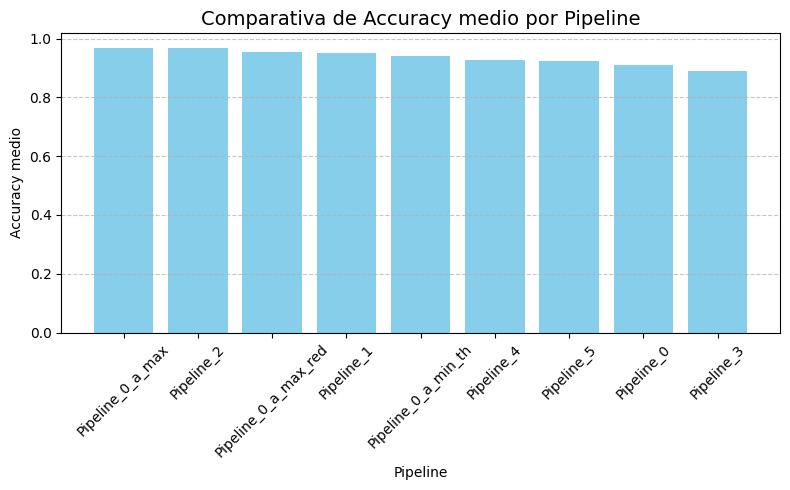

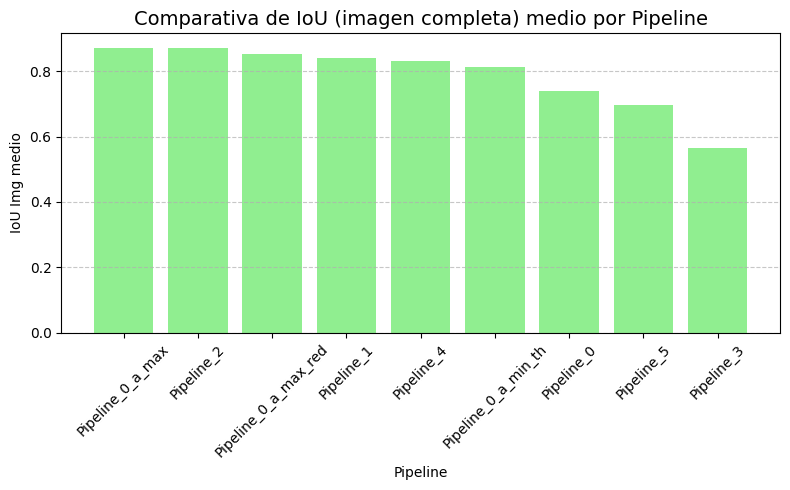

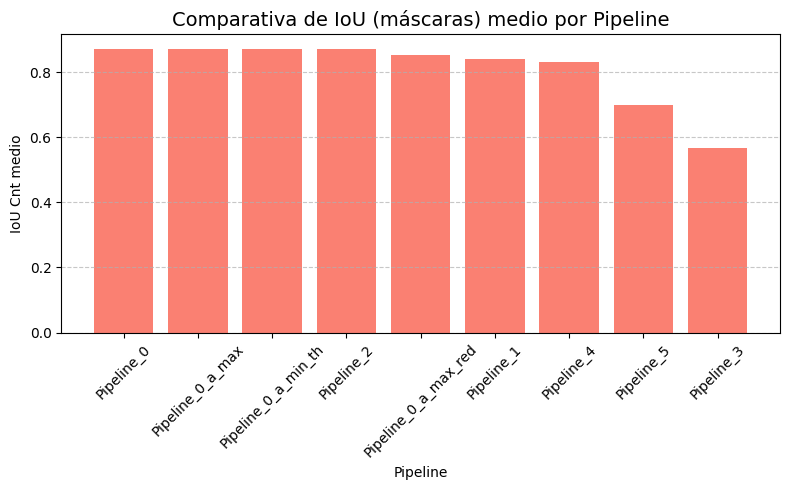

In [45]:
import matplotlib.pyplot as plt

# --- 1️⃣ Accuracy promedio ---
df_acc = df_summary.sort_values("acc_avg", ascending=False)

plt.figure(figsize=(8, 5))
plt.bar(df_acc["pipeline_name"], df_acc["acc_avg"], color="skyblue")
plt.title("Comparativa de Accuracy medio por Pipeline", fontsize=14)
plt.xlabel("Pipeline")
plt.ylabel("Accuracy medio")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- 2️⃣ IoU (Imagen completa) promedio ---
df_iou_img = df_summary.sort_values("iou_img_avg", ascending=False)

plt.figure(figsize=(8, 5))
plt.bar(df_iou_img["pipeline_name"], df_iou_img["iou_img_avg"], color="lightgreen")
plt.title("Comparativa de IoU (imagen completa) medio por Pipeline", fontsize=14)
plt.xlabel("Pipeline")
plt.ylabel("IoU Img medio")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- 3️⃣ IoU (Máscaras / contornos) promedio ---
df_iou_cm = df_summary.sort_values("iou_cm_avg", ascending=False)

plt.figure(figsize=(8, 5))
plt.bar(df_iou_cm["pipeline_name"], df_iou_cm["iou_cm_avg"], color="salmon")
plt.title("Comparativa de IoU (máscaras) medio por Pipeline", fontsize=14)
plt.xlabel("Pipeline")
plt.ylabel("IoU Cnt medio")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


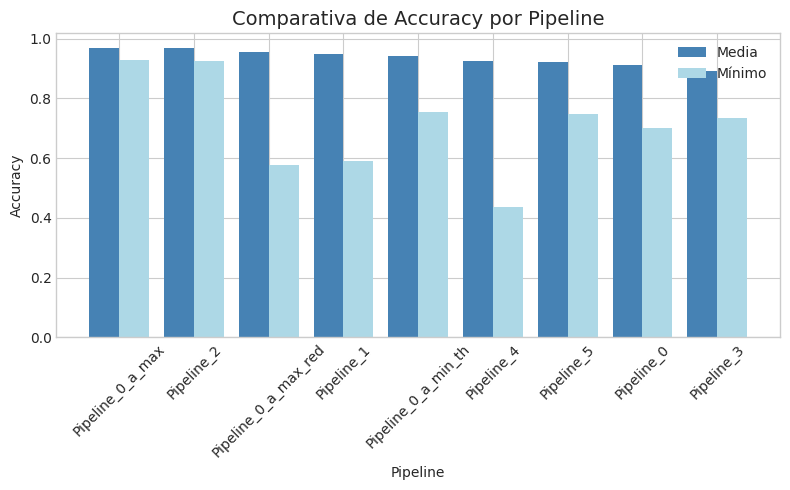

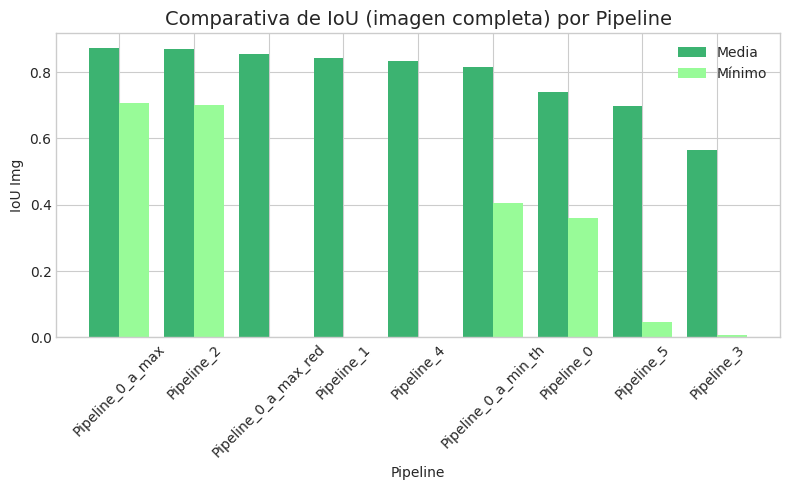

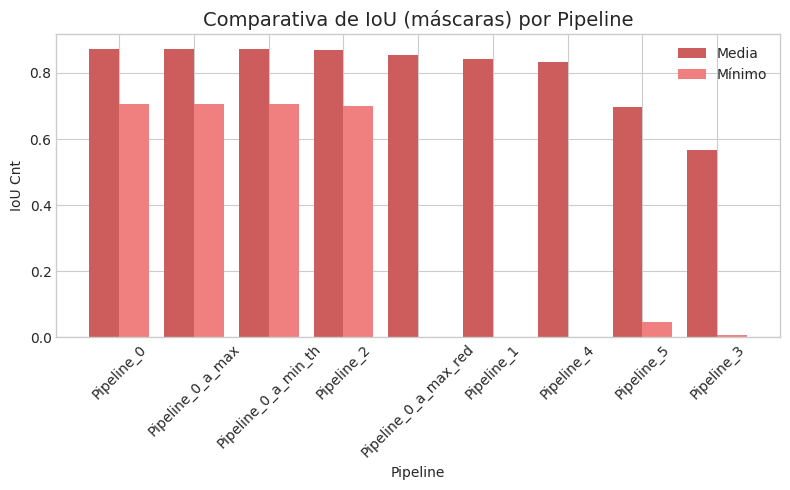

In [46]:
import matplotlib.pyplot as plt
import numpy as np

# --- Configuración general ---
plt.style.use('seaborn-v0_8-whitegrid')
bar_width = 0.4

# ---------- 1️⃣ Accuracy ----------
df_acc = df_summary.sort_values("acc_avg", ascending=False)
x = np.arange(len(df_acc))

plt.figure(figsize=(8,5))
plt.bar(x - bar_width/2, df_acc["acc_avg"], width=bar_width, label="Media", color="steelblue")
plt.bar(x + bar_width/2, df_acc["acc_min"], width=bar_width, label="Mínimo", color="lightblue")
plt.xticks(x, df_acc["pipeline_name"], rotation=45)
plt.title("Comparativa de Accuracy por Pipeline", fontsize=14)
plt.xlabel("Pipeline")
plt.ylabel("Accuracy")
plt.legend()
plt.tight_layout()
plt.show()


# ---------- 2️⃣ IoU (imagen completa) ----------
df_iou_img = df_summary.sort_values("iou_img_avg", ascending=False)
x = np.arange(len(df_iou_img))

plt.figure(figsize=(8,5))
plt.bar(x - bar_width/2, df_iou_img["iou_img_avg"], width=bar_width, label="Media", color="mediumseagreen")
plt.bar(x + bar_width/2, df_iou_img["iou_img_min"], width=bar_width, label="Mínimo", color="palegreen")
plt.xticks(x, df_iou_img["pipeline_name"], rotation=45)
plt.title("Comparativa de IoU (imagen completa) por Pipeline", fontsize=14)
plt.xlabel("Pipeline")
plt.ylabel("IoU Img")
plt.legend()
plt.tight_layout()
plt.show()


# ---------- 3️⃣ IoU (máscaras / contornos) ----------
df_iou_cm = df_summary.sort_values("iou_cm_avg", ascending=False)
x = np.arange(len(df_iou_cm))

plt.figure(figsize=(8,5))
plt.bar(x - bar_width/2, df_iou_cm["iou_cm_avg"], width=bar_width, label="Media", color="indianred")
plt.bar(x + bar_width/2, df_iou_cm["iou_cm_min"], width=bar_width, label="Mínimo", color="lightcoral")
plt.xticks(x, df_iou_cm["pipeline_name"], rotation=45)
plt.title("Comparativa de IoU (máscaras) por Pipeline", fontsize=14)
plt.xlabel("Pipeline")
plt.ylabel("IoU Cnt")
plt.legend()
plt.tight_layout()
plt.show()
